In [4]:
%run supportvectors-common.ipynb



<div style="color:#aaa;font-size:8pt">
<hr/>

 </blockquote>
 <hr/>
</div>



# Decision Tree

Also called the **Classification & Regression Tree**, because they can be used for both classification and regression modeling with data. In this lab we will learn to apply the decision-tree algorithm to some of the datasets we have encountered in the past.

Let us start with some utility functions that will help  us summarize and visualize the data.

#### Utility functions

In [84]:
from typing import List

def scatterplot(index, data, ax) -> None:
    """
    A helper function to plot the 2-D data. 
    It presumes the features are 'x1' & 'x2'
    """
    ax.scatter(data['x1'],   # as the x-axis 
            data['x2'],   # as the y-axis
            s=100, # size
            alpha=0.5, #opacity/transparency
            c=data['t'],
             cmap="RdBu")
    ax.set_xlabel (r"$x1$", fontsize=25)
    ax.set_ylabel(r"$x2$", fontsize=25)
    title =  f'Scatterplot of classifier-{index}'
    ax.set_title(title, fontsize=30)

def load_classifier_datasets () -> List[pd.DataFrame]:
    
    datasets = []


    for i in range(1,4):
        file = f"https://raw.githubusercontent.com/supportvectors/ml-100/master/classifier-{i}.csv"
        data = pd.read_csv(file)
        data = data.dropna()
        datasets.append(data)
        
    return datasets

def display_data_summary(data:pd.DataFrame, index:int) -> None:
    display(HTML (f'<h4 style="text-align:center">DATASET: classifier-{index}</h4>'))
    html = data.describe(include='all').transpose().to_html()
    display(HTML(html))
    
def display_classifier_metrics (model, X_train,  X_test, y_train, y_test):
    fig, axes = plt.subplots(2, 2)

    visualgrid = [
        FeatureImportances(model, ax=axes[0][0]),
        ConfusionMatrix(model, ax=axes[0][1]),
        ClassificationReport(model, ax=axes[1][0]),
        ROCAUC(model, ax=axes[1][1]),
    ]

    for viz in visualgrid:
        viz.fit(X_train, y_train)
        viz.score(X_test, y_test, )
        viz.finalize()

    plt.suptitle(r'\textbf{Decision Tree model diagnostics}', fontsize=25);
    plt.tight_layout();
    plt.show();

#### Load, summarize & visualize the data.

In [55]:
from IPython.display import Markdown, HTML
datasets = load_classifier_datasets()

for index, data in enumerate(datasets):
    display_data_summary(data, index)   

,count,mean,std,min,25%,50%,75%,max
x1,3000.0,-0.115546,6.004582,-13.153,-5.28700,0.0215,4.90475,13.339
x2,3000.0,0.035955,6.030188,-13.651,-5.05525,0.0780,5.04300,14.171
t,3000.0,0.562667,0.496140,0.000,0.00000,1.0000,1.00000,1.000


,count,mean,std,min,25%,50%,75%,max
x1,4000.0,7.268345,4.312628,-2.806,3.62375,7.732,10.37125,19.585
x2,4000.0,8.258256,3.945063,-1.334,4.56225,8.554,11.66725,19.519
t,4000.0,1.500000,1.118174,0.000,0.75000,1.500,2.25000,3.000


,count,mean,std,min,25%,50%,75%,max
x1,2000.0,0.572446,4.020438,-13.962782,-2.199305,0.702220,3.181777,13.999959
x2,2000.0,0.527342,3.954696,-14.261571,-2.136168,0.536767,3.164408,15.570375
t,2000.0,0.368500,0.482519,0.000000,0.000000,0.000000,1.000000,1.000000


### Visualize the three datasets

Let us remind ourselves of these old friends from our previous labs through a quick visualization.

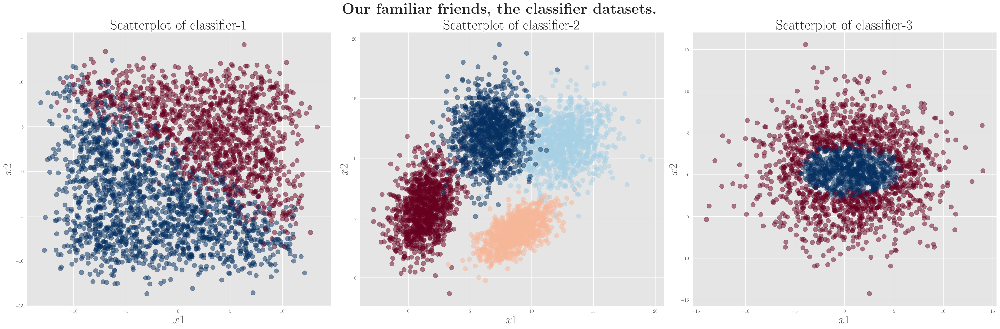

In [59]:
fig, ax = plt.subplots(1,3, figsize=(30, 10))
for i, data in enumerate(datasets):
    scatterplot (i+1, data, ax[i])

plt.suptitle(r'\textbf{Our familiar friends, the classifier datasets.}', fontsize=32)    
plt.tight_layout()

### Decision Tree Classifier

Let us now try the decision tree algorithm for creating a classifier.

In [60]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz  

In [82]:


trees = []
for index, data in enumerate(datasets):
    X, y = data[['x1', 'x2']], data['t']
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
    tree = DecisionTreeClassifier(random_state=42).fit(X_train, y_train)
    ŷ = tree.predict(X_test)
    name = f'Classifier-{index + 1}'
    trees.append(tree)
    
    
    display(HTML(f'<h4 style="text-align:center">Decision Tree for {name}</h4>'))
    confusion_matrix_ = confusion_matrix(y_test, ŷ)
    print(confusion_matrix_)
    print(classification_report(y_test, ŷ))

    

[[290  30]
 [ 41 389]]
              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89       320
         1.0       0.93      0.90      0.92       430

    accuracy                           0.91       750
   macro avg       0.90      0.91      0.90       750
weighted avg       0.91      0.91      0.91       750



[[261   0   0   7]
 [  1 238   0   1]
 [  0   2 218  16]
 [  1   0  17 238]]
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98       268
         1.0       0.99      0.99      0.99       240
         2.0       0.93      0.92      0.93       236
         3.0       0.91      0.93      0.92       256

    accuracy                           0.95      1000
   macro avg       0.96      0.95      0.95      1000
weighted avg       0.96      0.95      0.96      1000



[[305  14]
 [ 14 167]]
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       319
         1.0       0.92      0.92      0.92       181

    accuracy                           0.94       500
   macro avg       0.94      0.94      0.94       500
weighted avg       0.94      0.94      0.94       500



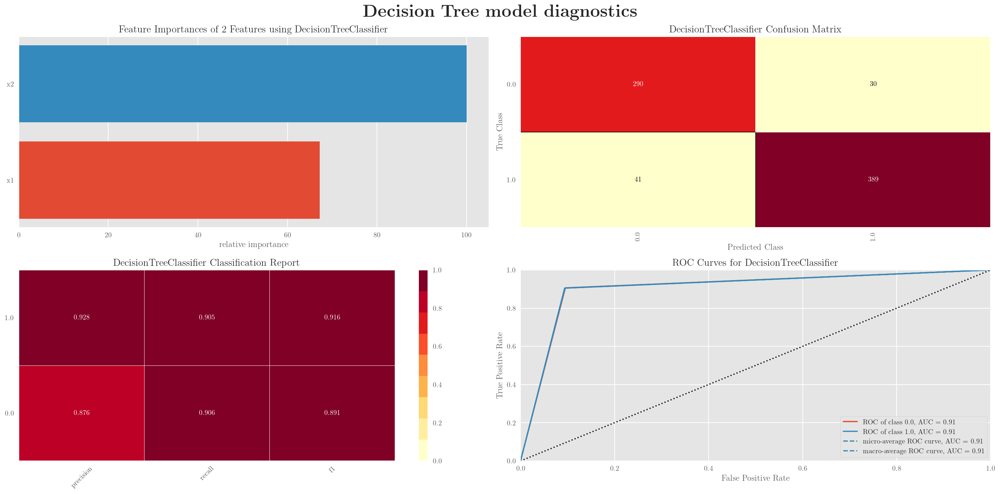

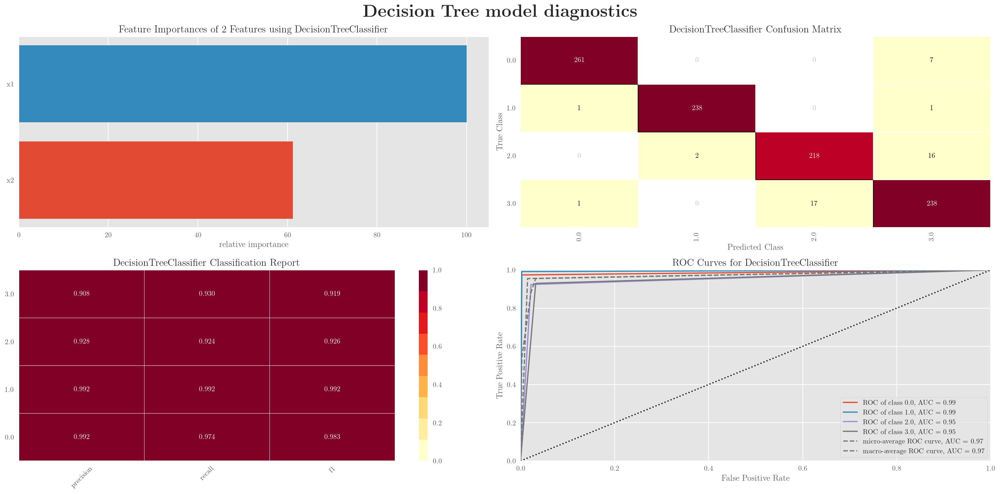

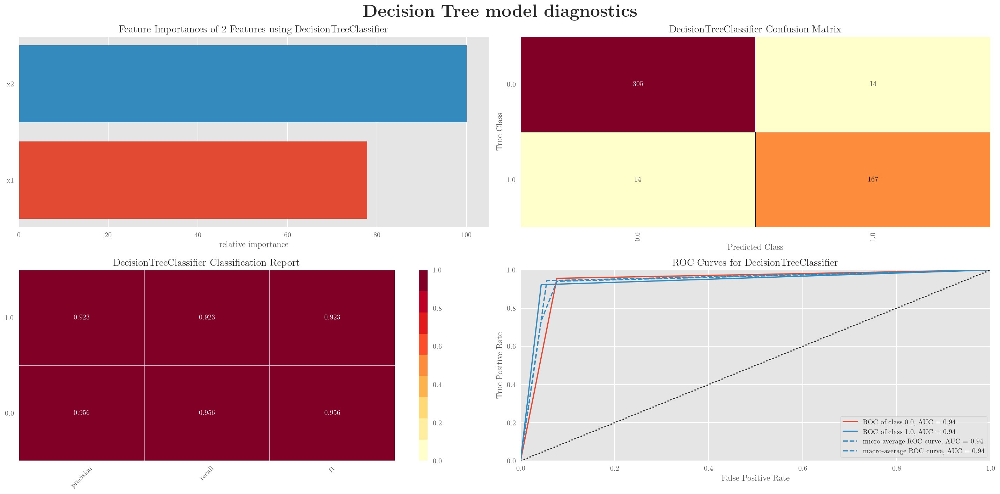

In [85]:
for index, data in enumerate(datasets):
    
    data = datasets[index]
    name = f'Classifier-{index + 1}'
    X, y = data[['x1', 'x2']], data['t']
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
    display(HTML(f'<h4 style="text-align:center">Decision Tree Model Metrics for {name}</h4>'))

    display_classifier_metrics(trees[index],X_train, X_test, y_train, y_test )

#### Decision boundary visualization 

Let us now visualize the decision boundary that each of the tree models have learned from the training data.

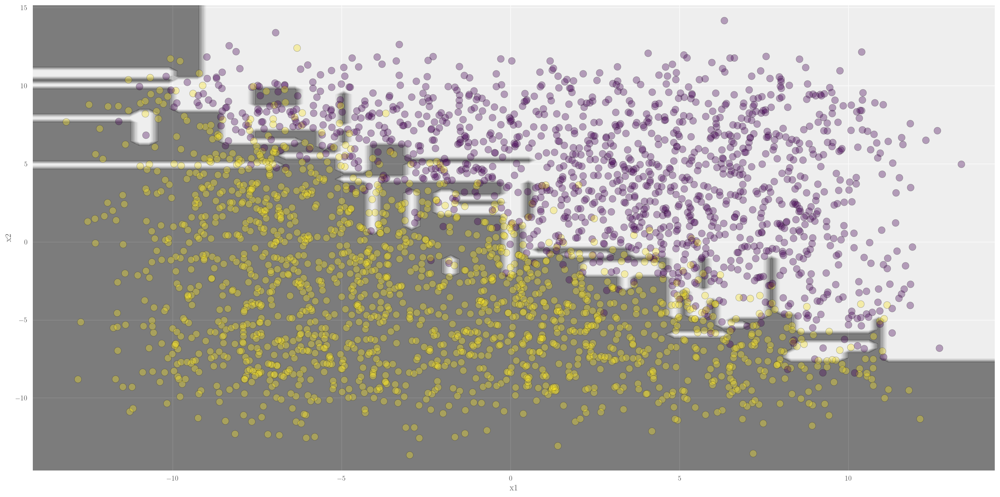

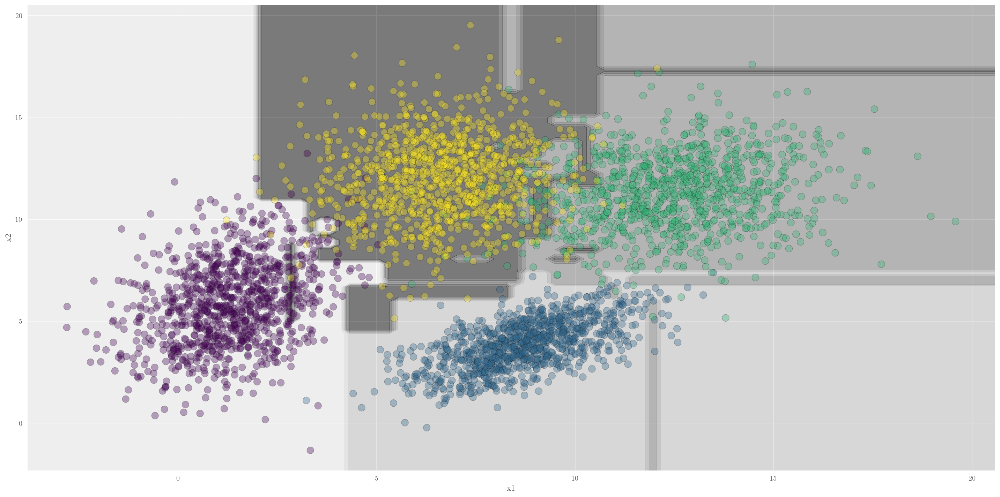

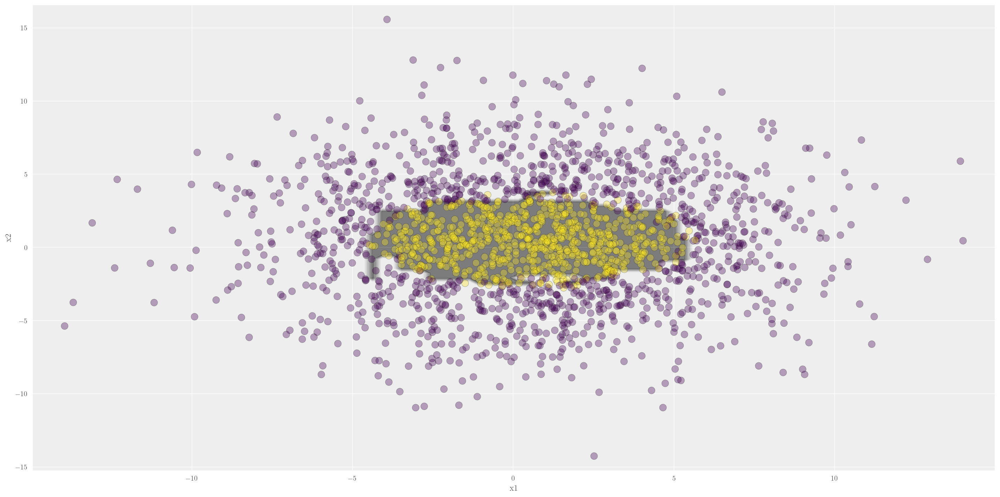

In [101]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import DecisionBoundaryDisplay

for index, (data, tree) in enumerate(zip (datasets, trees)):
    X, y = data[['x1', 'x2']], data['t']
    name = f'Classifier-{index + 1}'
    display(HTML(f'<h4 style="text-align:center">Decision Boundary for {name}</h4>'))
    disp = DecisionBoundaryDisplay.from_estimator(
        tree, X, response_method="predict",
        alpha=0.5,
    )
    disp.ax_.scatter(X['x1'], X['x2'], c=y, edgecolor="k", cmap='viridis', s=100, alpha=0.35)
    plt.tight_layout()
    plt.show()

### Plotting the decision trees

Let us now plot the three decision tree models.

**Caution**: This can take quite some time to render, so be patient!

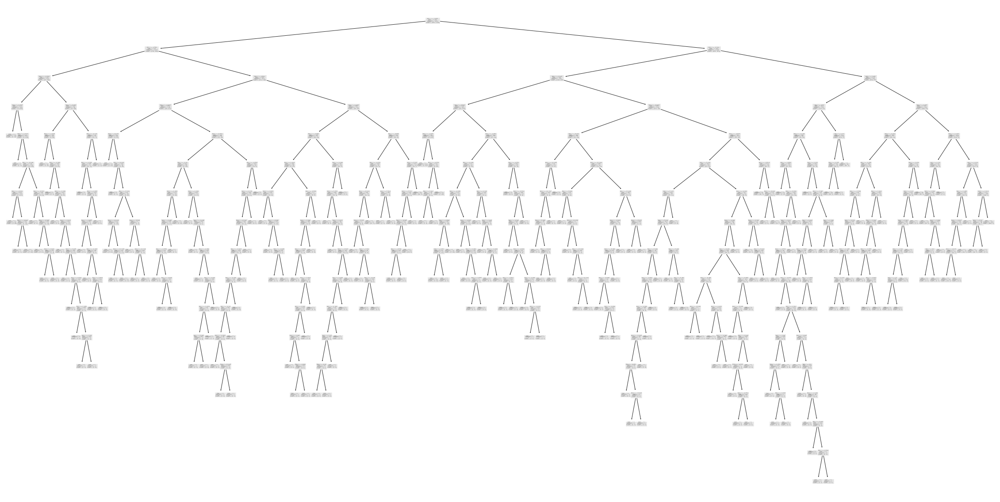

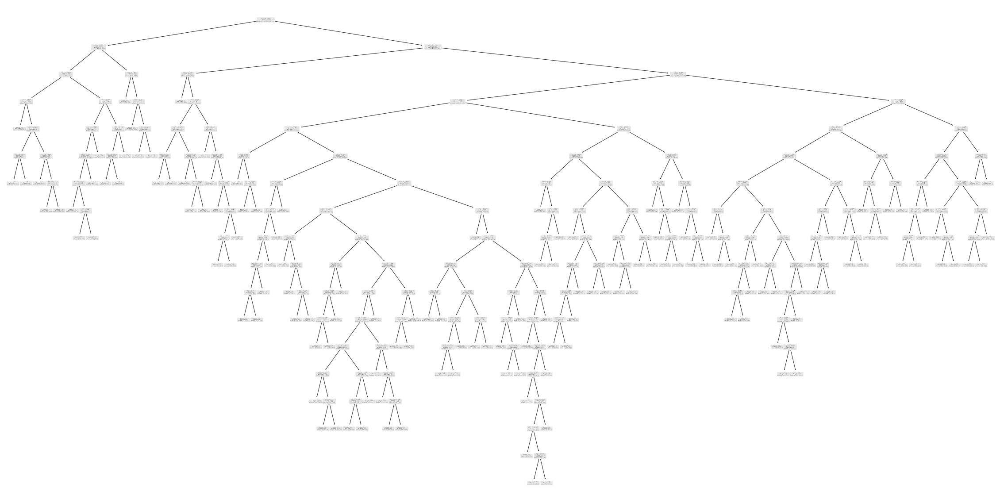

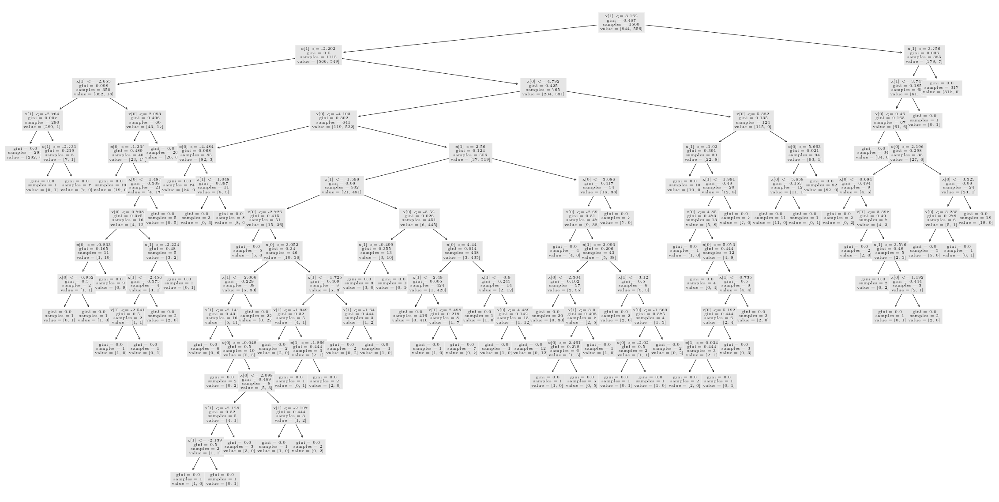

In [88]:
from sklearn.tree import plot_tree
for index, tree in enumerate(trees):
    name = f'Classifier-{index + 1}'
    display(HTML(f'<h4 style="text-align:center">Decision tree visualization for {name}</h4>'))
    plot_tree(tree);
    plt.show();
